In [2]:
import os
import csv

# 폴더 경로 설정
accident_folders = [
    (r"C:\Users\ime203\Desktop\Graduation\cv-accident\classfication_data\Car-to-Car", 1),
    (r"C:\Users\ime203\Desktop\Graduation\cv-accident\classfication_data\Car-to-motorcycle", 2),
    (r"C:\Users\ime203\Desktop\Graduation\cv-accident\classfication_data\Car-to-bicycle", 2),
    (r"C:\Users\ime203\Desktop\Graduation\cv-accident\classfication_data\Car-to-Human", 3),
    (r"C:\Users\ime203\Desktop\Graduation\cv-accident\classfication_data\No Accident", 0)
]

# CSV 파일 생성
csv_file = 'image_labels.csv'
with open(csv_file, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image_path', 'label'])
    
    for folder, label in accident_folders:
        for img_name in os.listdir(folder):
            img_path = os.path.join(folder, img_name)
            writer.writerow([img_path, label])


In [10]:
import torch
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchvision import transforms
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np


# Dataset class definition
class AccidentDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 0]
        image = Image.open(img_path).convert('RGB')
        label = self.data.iloc[idx, 1]

        if self.transform:
            image = self.transform(image)

        return image, label

# Preprocessing and data augmentation
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# CSV file path
csv_file = r"C:\Users\ime203\Desktop\Graduation\image_labels.csv"

# Load dataset
dataset = AccidentDataset(csv_file, transform=transform)

# Split dataset into training and validation sets
train_idx, val_idx = train_test_split(np.arange(len(dataset)), test_size=0.2, random_state=42)
train_sampler = SubsetRandomSampler(train_idx)
val_sampler = SubsetRandomSampler(val_idx)

train_loader = DataLoader(dataset, batch_size=32, sampler=train_sampler)
val_loader = DataLoader(dataset, batch_size=32, sampler=val_sampler)



Epoch 1/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [20:50<00:00,  3.34s/it]


Epoch [1/5], Loss: 0.9944, Train Accuracy: 0.5675


Epoch 1/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:59<00:00,  1.91s/it]


Epoch [1/5], Validation Loss: 0.8841, Validation Accuracy: 0.6490


Epoch 2/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [23:43<00:00,  3.81s/it]


Epoch [2/5], Loss: 0.8045, Train Accuracy: 0.7042


Epoch 2/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]


Epoch [2/5], Validation Loss: 0.6971, Validation Accuracy: 0.7608


Epoch 3/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [23:41<00:00,  3.80s/it]


Epoch [3/5], Loss: 0.6448, Train Accuracy: 0.7795


Epoch 3/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:47<00:00,  1.78s/it]


Epoch [3/5], Validation Loss: 0.6175, Validation Accuracy: 0.7825


Epoch 4/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [24:59<00:00,  4.01s/it]


Epoch [4/5], Loss: 0.5711, Train Accuracy: 0.8058


Epoch 4/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:51<00:00,  1.82s/it]


Epoch [4/5], Validation Loss: 0.6264, Validation Accuracy: 0.7755


Epoch 5/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [24:45<00:00,  3.97s/it]


Epoch [5/5], Loss: 0.5215, Train Accuracy: 0.8148


Epoch 5/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]


Epoch [5/5], Validation Loss: 0.5454, Validation Accuracy: 0.8033


Final Validation: 100%|████████████████████████████████████████████████████████████████| 94/94 [02:48<00:00,  1.79s/it]


Final Validation Accuracy: 0.8032786885245902
Final Precision: 0.8054741707254047
Final Recall: 0.8032786885245902
Final F1 Score: 0.8042023638606504


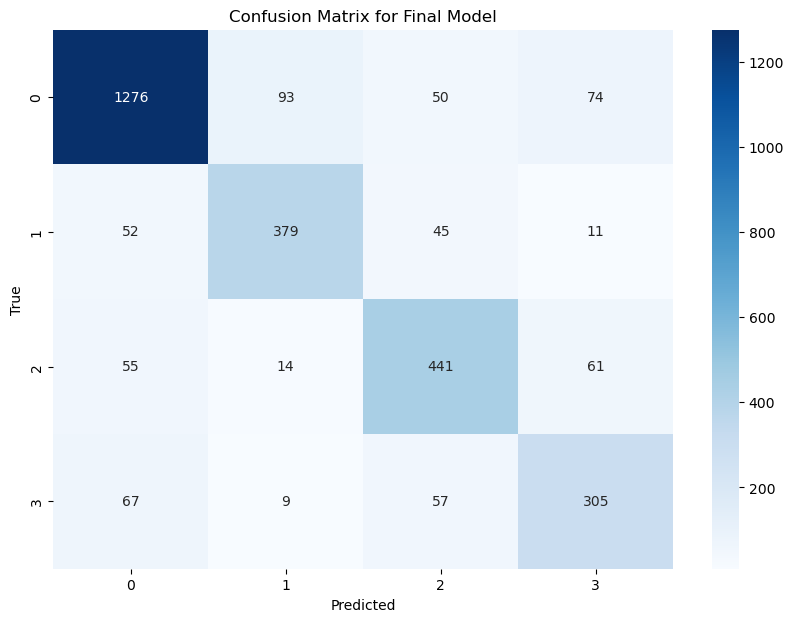

In [19]:
import os
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchvision import transforms, models
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from dotenv import load_dotenv
from tqdm import tqdm

# CNN+LSTM model definition
class CNNLSTMClassifier(nn.Module):
    def __init__(self, num_classes, hidden_dim=128, lstm_layers=2, lstm_dropout=0.5):
        super(CNNLSTMClassifier, self).__init__()
        self.cnn = models.shufflenet_v2_x1_0(weights=models.ShuffleNet_V2_X1_0_Weights.DEFAULT)
        num_ftrs = self.cnn.fc.in_features
        self.cnn.fc = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(num_ftrs, hidden_dim)
        )
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, lstm_layers, batch_first=True, dropout=lstm_dropout)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        if len(x.shape) == 5:
            batch_size, seq_length, c, h, w = x.size()
            cnn_out = []
            for t in range(seq_length):
                cnn_out.append(self.cnn(x[:, t, :, :, :]))

            cnn_out = torch.stack(cnn_out, dim=1)
            lstm_out, _ = self.lstm(cnn_out)
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        elif len(x.shape) == 4:
            cnn_out = self.cnn(x)
            lstm_out, _ = self.lstm(cnn_out.unsqueeze(1))
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        else:
            raise ValueError("Unsupported input shape")

        return out

# Initialize the CNN+LSTM model
num_classes = 4
cnn_lstm_model = CNNLSTMClassifier(num_classes=num_classes)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cnn_lstm_model.parameters(), lr=0.001)

# Dataset class definition
class AccidentDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 0]
        image = Image.open(img_path).convert('RGB')
        label = self.data.iloc[idx, 1]

        if self.transform:
            image = self.transform(image)

        return image, label

# Preprocessing and data augmentation
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# CSV file path
csv_file = r"C:\Users\ime203\Desktop\Graduation\image_labels.csv"

# Load dataset
dataset = AccidentDataset(csv_file, transform=transform)

# Split dataset into training and validation sets
train_idx, val_idx = train_test_split(np.arange(len(dataset)), test_size=0.2, random_state=42)
train_sampler = SubsetRandomSampler(train_idx)
val_sampler = SubsetRandomSampler(val_idx)

train_loader = DataLoader(dataset, batch_size=32, sampler=train_sampler)
val_loader = DataLoader(dataset, batch_size=32, sampler=val_sampler)

# Training the CNN+LSTM model
num_epochs = 5
for epoch in range(num_epochs):
    cnn_lstm_model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Training"):
        optimizer.zero_grad()
        outputs = cnn_lstm_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = correct / total
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}, Train Accuracy: {train_accuracy:.4f}")

    # Validation
    cnn_lstm_model.eval()
    val_running_loss = 0.0
    val_predictions = []
    val_labels = []
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Validation"):
            outputs = cnn_lstm_model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_predictions.extend(predicted.numpy())
            val_labels.extend(labels.numpy())

    val_accuracy = accuracy_score(val_labels, val_predictions)
    val_loss = val_running_loss / len(val_loader)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

# Final evaluation
cnn_lstm_model.eval()
val_predictions = []
val_labels = []
with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Final Validation"):
        outputs = cnn_lstm_model(images)
        _, predicted = torch.max(outputs, 1)
        val_predictions.extend(predicted.numpy())
        val_labels.extend(labels.numpy())

# Evaluate the final model
val_accuracy = accuracy_score(val_labels, val_predictions)
conf_matrix = confusion_matrix(val_labels, val_predictions)
prec = precision_score(val_labels, val_predictions, average='weighted')
rec = recall_score(val_labels, val_predictions, average='weighted')
f1 = f1_score(val_labels, val_predictions, average='weighted')

print(f'Final Validation Accuracy: {val_accuracy}')
print(f'Final Precision: {prec}')
print(f'Final Recall: {rec}')
print(f'Final F1 Score: {f1}')

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Final Model')
plt.show()


In [55]:
# 모델의 상태 저장
torch.save(cnn_lstm_model.state_dict(), 'cnn_lstm_model.pth')

Predicting frames with CNN+LSTM: 100%|█████████████████████████████████████████████████| 32/32 [00:00<00:00, 33.66it/s]


OpenAI API Response: {'id': 'chatcmpl-9a5QkCPvYzwi1rrOXY5in2BFmN8JK', 'object': 'chat.completion', 'created': 1718387710, 'model': 'gpt-4o-2024-05-13', 'choices': [{'index': 0, 'message': {'role': 'assistant', 'content': 'There is no visible accident in the provided image. The image shows various vehicles (cars, motorcycles, buses) and people in a busy intersection.'}, 'logprobs': None, 'finish_reason': 'stop'}], 'usage': {'prompt_tokens': 1162, 'completion_tokens': 29, 'total_tokens': 1191}, 'system_fingerprint': 'fp_aa87380ac5'}
OpenAI API Response: {'id': 'chatcmpl-9a5QoTZgQjpsfYRKZ6bDuyOsHh39j', 'object': 'chat.completion', 'created': 1718387714, 'model': 'gpt-4o-2024-05-13', 'choices': [{'index': 0, 'message': {'role': 'assistant', 'content': 'The image does not show any accident. Therefore, it does not fall into any of the listed categories.'}, 'logprobs': None, 'finish_reason': 'stop'}], 'usage': {'prompt_tokens': 1162, 'completion_tokens': 21, 'total_tokens': 1183}, 'system_fin

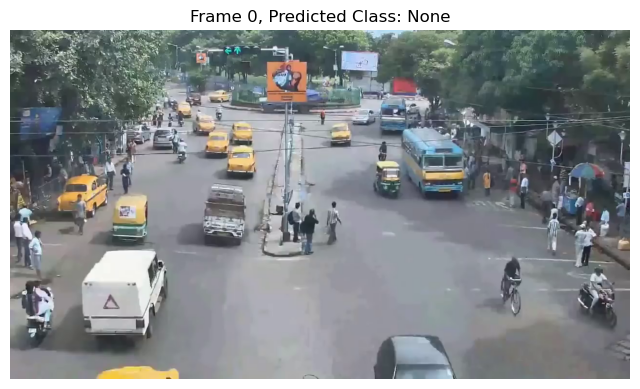

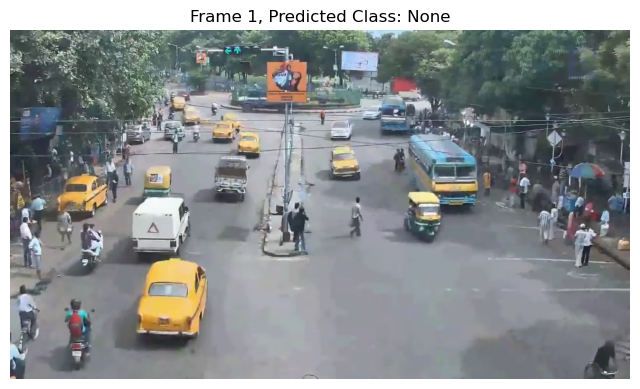

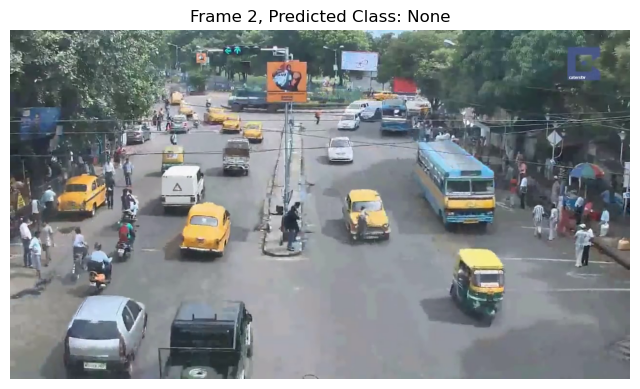

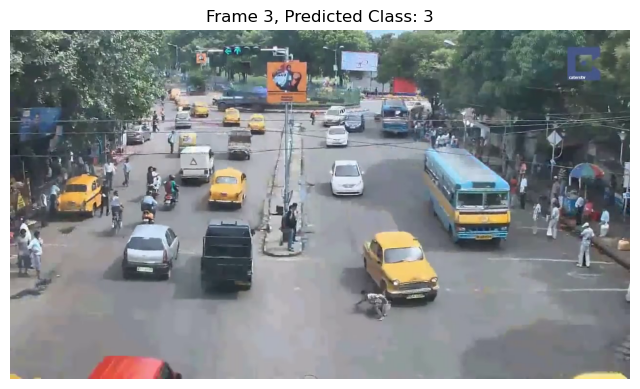

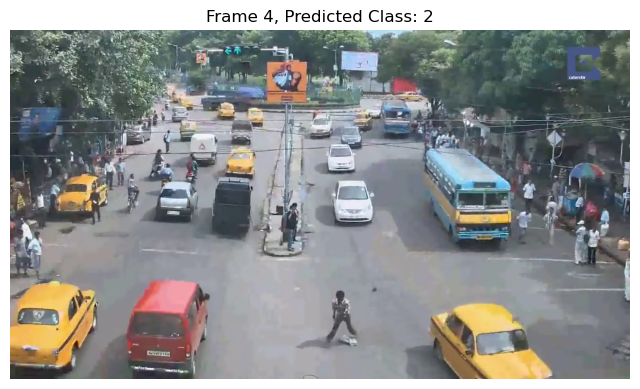

...

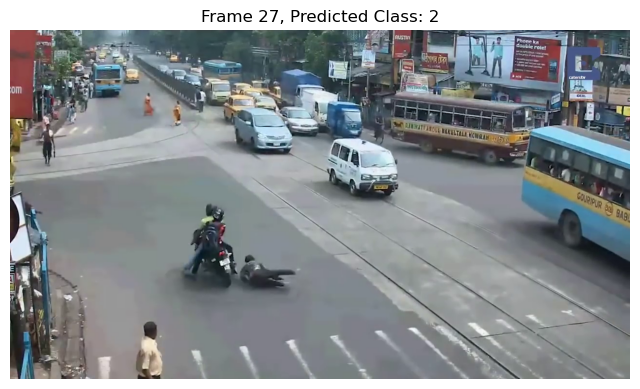

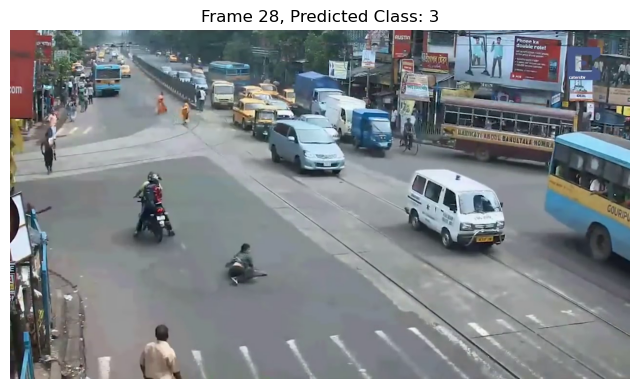

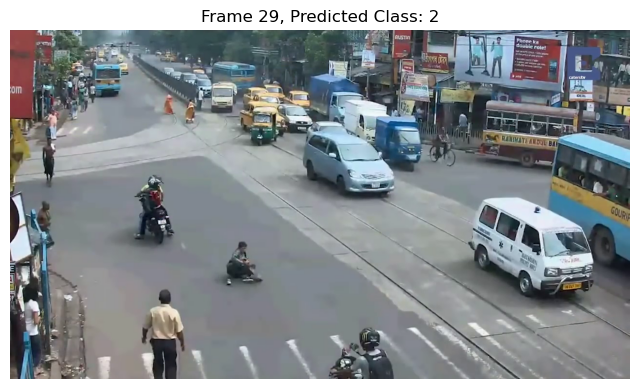

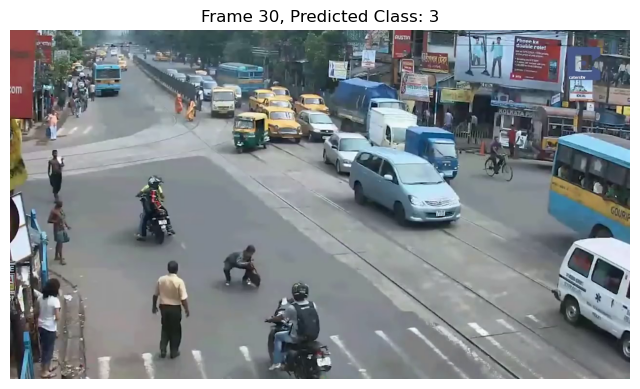

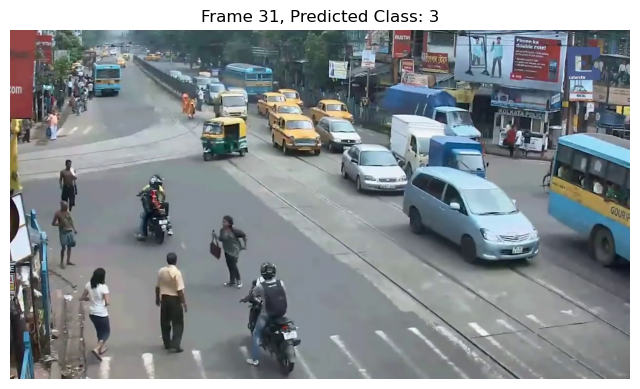

In [70]:
import os
import base64
import requests
import torch
from torch import nn
from torchvision import models, transforms
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

# Set up your OpenAI API credentials
load_dotenv('.env')
openai_api_key = os.getenv('OPENAI_API_KEY')

# Function to encode the image
def encode_image(img_path):
    with open(img_path, "rb") as img_file:
        return base64.b64encode(img_file.read()).decode('utf-8')
    
def classify_accident(api_key, img_path):
    base64_image = encode_image(img_path)

    headers = {
        "Content-Type": "application/json",
        "Authorization": f"Bearer {api_key}"
    }

    payload = {
    "model": "gpt-4o",
    "messages": [
        {
        "role": "user",
        "content": [
            {
            "type": "text",
            "text": "Classify this image into following categories: (1) Car-to-car accident, (2) Car-to-human accident, (3) Car-to-motorcycle, (4) Car-to-bicycle accident. Answer with the number of the category."
            },
            {
            "type": "image_url",
            "image_url": {
                "url": f"data:image/jpeg;base64,{base64_image}"
            }
            }
        ]
        }
    ],
    "max_tokens": 300
    }

    response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)

    return response.json()



    response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)
    print("OpenAI API Response:", response.json())  # Check the response from OpenAI API
    return response.json()

def get_answer(response):
    if response and 'choices' in response:
        message_content = response['choices'][0]['message']['content']
        if "1" in message_content:
            return 1
        elif "2" in message_content:
            return 3
        elif "3" in message_content:
            return 2
        elif "4" in message_content:
            return 2
        else:
            return 0  # No accident
    return 0  # No accident

# CNN+LSTM model definition
class CNNLSTMClassifier(nn.Module):
    def __init__(self, num_classes, hidden_dim=128, lstm_layers=2, lstm_dropout=0.5):
        super(CNNLSTMClassifier, self).__init__()
        self.cnn = models.shufflenet_v2_x1_0(pretrained=True)
        num_ftrs = self.cnn.fc.in_features
        self.cnn.fc = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(num_ftrs, hidden_dim)
        )
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, lstm_layers, batch_first=True, dropout=lstm_dropout)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        if len(x.shape) == 5:
            batch_size, seq_length, c, h, w = x.size()
            cnn_out = []
            for t in range(seq_length):
                cnn_out.append(self.cnn(x[:, t, :, :, :]))

            cnn_out = torch.stack(cnn_out, dim=1)
            lstm_out, _ = self.lstm(cnn_out)
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        elif len(x.shape) == 4:
            cnn_out = self.cnn(x)
            lstm_out, _ = self.lstm(cnn_out.unsqueeze(1))
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        else:
            raise ValueError("Unsupported input shape")

        return out

def extract_frames_from_video(video_path, frame_interval):
    frames = []
    cap = cv2.VideoCapture(video_path)
    frame_count = 0
    
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        if frame_count % frame_interval == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)
        
        frame_count += 1
    
    cap.release()
    return frames

def predict_frame_cnnlstm(frame, model, transform, device):
    image = Image.fromarray(frame).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)
    
    cnn_lstm_model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        outputs = cnn_lstm_model(image)
        _, predicted = torch.max(outputs, 1)
    return predicted.item()

def predict_video_cnnlstm(video_path, model, transform, device, frame_interval=30):
    frames = extract_frames_from_video(video_path, frame_interval)
    predictions = []
    
    for frame in tqdm(frames, desc="Predicting frames with CNN+LSTM"):
        predicted_class = predict_frame_cnnlstm(frame, model, transform, device)
        predictions.append((frame, predicted_class))
    
    return predictions

# 예시 코드에서 사용하는 transform 정의
transform_cnnlstm = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# CNN+LSTM 모델 초기화
num_classes_cnnlstm = 4
cnn_lstm_model = CNNLSTMClassifier(num_classes=num_classes_cnnlstm)

# 학습된 모델의 가중치 불러오기 (예시에서는 생략)
# cnn_lstm_model.load_state_dict(torch.load('model_weights.pth'))

# 장치 설정 (GPU 또는 CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cnn_lstm_model.to(device)

# 테스트할 비디오 경로
video_path = r"C:\Users\ime203\Downloads\Indian Car Accident Narrow Escapes.mp4"  # Adjust path to your test video

# 비디오 프레임 예측
predictions_cnnlstm = predict_video_cnnlstm(video_path, cnn_lstm_model, transform_cnnlstm, device, frame_interval=30)

def classify_image_with_openai(api_key, img_path):
    response = classify_accident(api_key, img_path)
    print("OpenAI API Response:", response)  # Check the response from OpenAI API
    return get_answer(response)

def ensemble_predictions(predictions_cnnlstm, api_key, threshold=1):
    ensemble_predictions = []
    
    for frame, _ in predictions_cnnlstm:
        img_path = "temp_frame.jpg"  # 임시 이미지 파일 경로
        
        # 임시 이미지 파일 저장
        cv2.imwrite(img_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
        
        # OpenAI API를 사용하여 이미지 분류
        predicted_class_openai = classify_image_with_openai(api_key, img_path)
        
        # OpenAI API의 예측 결과가 None이 아니고, 확신도가 threshold 이상인 경우 사용
        if predicted_class_openai != 0 and predicted_class_openai >= threshold:
            ensemble_predictions.append((frame, predicted_class_openai))
        else:
            # OpenAI API의 예측이 None이거나 확신도가 threshold 미만인 경우 None으로 처리
            ensemble_predictions.append((frame, None))
    
    return ensemble_predictions

# Ensemble 모델을 이용한 예측
# OpenAI API의 확신도 임계값
predictions_ensemble = ensemble_predictions(predictions_cnnlstm, openai_api_key, threshold)

# 예측 결과 시각화
class_names = ['Normal', '1', '2', '3']  # 예시 클래스 이름
for i, (frame, prediction) in enumerate(predictions_ensemble):
    plt.figure(figsize=(8, 6))
    plt.imshow(frame)
    if prediction is not None:
        plt.title(f"Frame {i}, Predicted Class: {class_names[prediction]}")
    else:
        plt.title(f"Frame {i}, Predicted Class: None")
    plt.axis('off')
    plt.show()


In [17]:
import os
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchvision import transforms, models
from PIL import Image
import pandas as pd
import requests
import base64
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from dotenv import load_dotenv
from tqdm import tqdm

# Set up your OpenAI API credentials
load_dotenv('.env')
openai_api_key = os.getenv('OPENAI_API_KEY')

# Function to encode the image
def encode_image(img_path):
    with open(img_path, "rb") as img_file:
        return base64.b64encode(img_file.read()).decode('utf-8')


def classify_accident(api_key, img_path):
    base64_image = encode_image(img_path)
    headers = {
        "Content-Type": "application/json",
        "Authorization": f"Bearer {api_key}"
    }
    payload = {
        "model": "gpt-4o",
        "messages": [
            {
                "role": "user",
                "content": {
                    "type": "text",
                    "text": "Classify this image into the following categories: (1) Car-to-car accident, (2) Car-to-human accident, (3) Car-to-motorcycle, (4) Car-to-bicycle accident. Answer with the number of the category."
                }
            },
            {
                "role": "user",
                "content": {
                    "type": "image",
                    "data": f"data:image/jpeg;base64,{base64_image}"
                }
            }
        ],
        "max_tokens": 300
    }

    response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)
    return response.json()


# Function to get answer from OpenAI response
def get_answer(response):
    if response and 'choices' in response:
        message_content = response['choices'][0]['message']['content']
        if "1" in message_content:
            return 1
        elif "2" in message_content:
            return 3
        elif "3" in message_content:
            return 2
        elif "4" in message_content:
            return 2
        else:
            return 0  # No accident

# CNN+LSTM model definition
class CNNLSTMClassifier(nn.Module):
    def __init__(self, num_classes, hidden_dim=128, lstm_layers=2, lstm_dropout=0.5):
        super(CNNLSTMClassifier, self).__init__()
        self.cnn = models.shufflenet_v2_x1_0(pretrained=True)
        num_ftrs = self.cnn.fc.in_features
        self.cnn.fc = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(num_ftrs, hidden_dim)
        )
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, lstm_layers, batch_first=True, dropout=lstm_dropout)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        if len(x.shape) == 5:
            batch_size, seq_length, c, h, w = x.size()
            cnn_out = []
            for t in range(seq_length):
                cnn_out.append(self.cnn(x[:, t, :, :, :]))

            cnn_out = torch.stack(cnn_out, dim=1)
            lstm_out, _ = self.lstm(cnn_out)
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        elif len(x.shape) == 4:
            cnn_out = self.cnn(x)
            lstm_out, _ = self.lstm(cnn_out.unsqueeze(1))
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        else:
            raise ValueError("Unsupported input shape")

        return out


# Initialize the CNN+LSTM model
num_classes = 4
cnn_lstm_model = CNNLSTMClassifier(num_classes=num_classes)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cnn_lstm_model.parameters(), lr=0.001)

# Training and Validation
num_epochs = 5
for epoch in range(num_epochs):
    # Training
    cnn_lstm_model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Training"):
        optimizer.zero_grad()
        outputs = cnn_lstm_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = correct / total
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}, Train Accuracy: {train_accuracy:.4f}")

    # Validation
    cnn_lstm_model.eval()
    val_predictions = []
    val_labels = []
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Validation"):
            outputs = cnn_lstm_model(images)
            _, predicted = torch.max(outputs, 1)
            val_predictions.extend(predicted.numpy())
            val_labels.extend(labels.numpy())

    # Evaluate the CNN+LSTM model
    val_accuracy = accuracy_score(val_labels, val_predictions)
    print(f'Validation Accuracy: {val_accuracy}')

    # OpenAI predictions on the validation set
    openai_predictions = []
    for idx in tqdm(val_idx, desc=f"Epoch {epoch + 1}/{num_epochs} - OpenAI Predictions"):
        image_path = dataset.data.iloc[idx, 0]
        openai_response = classify_accident(openai_api_key, image_path)
        openai_answer = get_answer(openai_response)
        openai_predictions.append(openai_answer)

    # Ensemble predictions
    ensemble_predictions_list = []
    for cnn_pred, openai_pred in zip(val_predictions, openai_predictions):
        ensemble_prediction = ensemble_predictions(cnn_pred, openai_pred)
        ensemble_predictions_list.append(ensemble_prediction)

    # Evaluate the ensemble model
    ensemble_acc = accuracy_score(val_labels, ensemble_predictions_list)
    print(f'Ensemble Accuracy: {ensemble_acc}')

    # Calculate other metrics for ensemble model
    ensemble_prec = precision_score(val_labels, ensemble_predictions_list, average='weighted')
    ensemble_rec = recall_score(val_labels, ensemble_predictions_list, average='weighted')
    ensemble_f1 = f1_score(val_labels, ensemble_predictions_list, average='weighted')

    print(f'Ensemble Precision: {ensemble_prec}')
    print(f'Ensemble Recall: {ensemble_rec}')
    print(f'Ensemble F1 Score: {ensemble_f1}')

    # Plot confusion matrix for ensemble model
    conf_matrix_ensemble = confusion_matrix(val_labels, ensemble_predictions_list)

    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix_ensemble, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for Ensemble Model - Epoch {epoch + 1}')
    plt.show()


C:\Users\ime203\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ime203\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/5 - Training: 100%|██████████████████████████████████████████████████████████| 374/374 [24:44<00:00,  3.97s/it]


Epoch [1/5], Loss: 0.9968, Train Accuracy: 0.5707


Epoch 1/5 - Validation: 100%|██████████████████████████████████████████████████████████| 94/94 [02:56<00:00,  1.88s/it]


Validation Accuracy: 0.6711274673803947


Epoch 1/5 - OpenAI Predictions:  14%|██████▌                                      | 433/2989 [35:07<3:53:35,  5.48s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  18%|████████▎                                    | 550/2989 [47:27<3:19:12,  4.90s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  24%|██████████▍                                | 726/2989 [1:02:13<2:36:44,  4.16s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  38%|███████████████▊                          | 1125/2989 [1:35:55<3:53:51,  7.53s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  45%|██████████████████▊                       | 1342/2989 [1:55:56<1:35:42,  3.49s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  46%|███████████████████▍                      | 1384/2989 [1:59:44<2:12:00,  4.94s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  51%|█████████████████████▌                    | 1537/2989 [2:12:36<1:28:44,  3.67s/it]

HTTP Error: 400 Client Error: Bad Request for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  63%|██████████████████████████▍               | 1878/2989 [2:45:36<1:32:05,  4.97s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  63%|███████████████████████████▋                | 1881/2989 [2:45:44<57:47,  3.13s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  64%|██████████████████████████▋               | 1901/2989 [2:47:17<1:03:52,  3.52s/it]

HTTP Error: 400 Client Error: Bad Request for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  65%|███████████████████████████▍              | 1952/2989 [2:51:41<1:06:44,  3.86s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  73%|████████████████████████████████            | 2178/2989 [3:11:29<51:49,  3.83s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  73%|████████████████████████████████            | 2179/2989 [3:11:34<55:03,  4.08s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  73%|██████████████████████████████▊           | 2189/2989 [3:12:24<1:01:07,  4.58s/it]

HTTP Error: 400 Client Error: Bad Request for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  82%|██████████████████████████████████▍       | 2454/2989 [3:36:11<1:21:58,  9.19s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  85%|█████████████████████████████████████▍      | 2547/2989 [3:47:09<34:17,  4.66s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  97%|██████████████████████████████████████████▋ | 2898/2989 [4:18:30<09:18,  6.14s/it]

HTTP Error: 500 Server Error: Internal Server Error for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  97%|██████████████████████████████████████████▋ | 2903/2989 [4:18:56<06:33,  4.57s/it]

HTTP Error: 400 Client Error: Bad Request for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions:  99%|███████████████████████████████████████████▎| 2946/2989 [4:22:29<02:47,  3.90s/it]

HTTP Error: 520 Server Error:  for url: https://api.openai.com/v1/chat/completions


Epoch 1/5 - OpenAI Predictions: 100%|████████████████████████████████████████████| 2989/2989 [4:26:13<00:00,  5.34s/it]


TypeError: unsupported operand type(s) for +: 'int' and 'NoneType'

In [ ]:
import os
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchvision import transforms, models
from PIL import Image
import pandas as pd
import requests
import base64
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from dotenv import load_dotenv
from tqdm import tqdm

# Set up your OpenAI API credentials
load_dotenv('.env')
openai_api_key = os.getenv('OPENAI_API_KEY')

# Function to encode the image
def encode_image(img_path):
    with open(img_path, "rb") as img_file:
        return base64.b64encode(img_file.read()).decode('utf-8')

# Function to classify accidents using OpenAI model
def classify_accident(api_key, img_path):
    base64_image = encode_image(img_path)

    headers = {
        "Content-Type": "application/json",
        "Authorization": f"Bearer {api_key}"
    }

    payload = {
        "model": "gpt-4o",
        "messages": [
            {
                "role": "user",
                "content": [
                    {
                        "type": "text",
                        "text": "Classify this image into following categories: (1) Car-to-car accident, (2) Car-to-human accident, (3) Car-to-motorcycle, (4) Car-to-bicycle accident. Answer with the number of the category."
                    },
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": f"data:image/jpeg;base64,{base64_image}"
                        }
                    }
                ]
            }
        ],
        "max_tokens": 300
    }

    response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)

    return response.json()

# Function to get answer from OpenAI response
def get_answer(response):
    if response and 'choices' in response:
        message_content = response['choices'][0]['message']['content']
        if "1" in message_content:
            return 1
        elif "2" in message_content:
            return 3
        elif "3" in message_content:
            return 2
        elif "4" in message_content:
            return 2
        else:
            return 0  # No accident

# CNN+LSTM model definition
class CNNLSTMClassifier(nn.Module):
    def __init__(self, num_classes, hidden_dim=128, lstm_layers=2, lstm_dropout=0.5):
        super(CNNLSTMClassifier, self).__init__()
        self.cnn = models.shufflenet_v2_x1_0(weights=models.ShuffleNet_V2_X1_0_Weights.DEFAULT)
        num_ftrs = self.cnn.fc.in_features
        self.cnn.fc = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(num_ftrs, hidden_dim)
        )
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, lstm_layers, batch_first=True, dropout=lstm_dropout)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        if len(x.shape) == 5:
            batch_size, seq_length, c, h, w = x.size()
            cnn_out = []
            for t in range(seq_length):
                cnn_out.append(self.cnn(x[:, t, :, :, :]))

            cnn_out = torch.stack(cnn_out, dim=1)
            lstm_out, _ = self.lstm(cnn_out)
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        elif len(x.shape) == 4:
            cnn_out = self.cnn(x)
            lstm_out, _ = self.lstm(cnn_out.unsqueeze(1))
            lstm_out = lstm_out[:, -1, :]
            out = self.fc(lstm_out)
        else:
            raise ValueError("Unsupported input shape")

        return out

# Initialize the CNN+LSTM model
num_classes = 4
cnn_lstm_model = CNNLSTMClassifier(num_classes=num_classes)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cnn_lstm_model.parameters(), lr=0.001)

# Training the CNN+LSTM model
num_epochs = 5
cnn_lstm_model.train()
for epoch in range(num_epochs):
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
        optimizer.zero_grad()
        outputs = cnn_lstm_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = correct / total
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}, Train Accuracy: {train_accuracy:.4f}")

# Validation
cnn_lstm_model.eval()
val_predictions = []
val_labels = []
with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Validation"):
        outputs = cnn_lstm_model(images)
        _, predicted = torch.max(outputs, 1)
        val_predictions.extend(predicted.numpy())
        val_labels.extend(labels.numpy())

# Evaluate the CNN+LSTM model
val_accuracy = accuracy_score(val_labels, val_predictions)
print(f'Validation Accuracy: {val_accuracy}')

# OpenAI predictions on the validation set
openai_predictions = []
for idx in tqdm(val_idx, desc="OpenAI Predictions"):
    image_path = dataset.data.iloc[idx, 0]
    openai_response = classify_accident(openai_api_key, image_path)
    openai_answer = get_answer(openai_response)
    openai_predictions.append(openai_answer)

# Function to combine predictions from both models
def ensemble_predictions(cnn_pred, openai_pred):
    return cnn_pred if cnn_pred == openai_pred else openai_pred

# Ensemble predictions
ensemble_predictions = []
for cnn_pred, openai_pred in zip(val_predictions, openai_predictions):
    ensemble_prediction = ensemble_predictions(cnn_pred, openai_pred)
    ensemble_predictions.append(ensemble_prediction)

# Evaluate the ensemble model
conf_matrix = confusion_matrix(val_labels, ensemble_predictions)
acc = accuracy_score(val_labels, ensemble_predictions)
prec = precision_score(val_labels, ensemble_predictions, average='weighted')
rec = recall_score(val_labels, ensemble_predictions, average='weighted')
f1 = f1_score(val_labels, ensemble_predictions, average='weighted')

print(f'Ensemble Accuracy: {acc}')
print(f'Ensemble Precision: {prec}')
print(f'Ensemble Recall: {rec}')
print(f'Ensemble F1 Score: {f1}')

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Ensemble Model')
plt.show()
